# Semantic Segmentation 152 classes - AWS Marketplace Model Package

This Solution offers semantic segmentation 152 classes using deep learning detection.

This notebook assists you in deploying NavInfo Europe's Model Package from AWS Marketplace.
The example code below can be tailored to your needs, you can always revert back to the original code as provided by Navinfo Europe B.V.   
Knowledge of AWS and Python is assumed.

We demonstrate here the capability to segment images into [152 classes](#7.-List-of-classes) with this AWS Marketplace Model Package.

#### Pre-requisites:
1. **Note**: This notebook renders correctly in Jupyter interface. Open this notebook from an Amazon SageMaker Notebook Instance or Amazon SageMaker Studio.
1. Ensure that IAM role used has **AmazonSageMakerFullAccess**
1. To deploy this ML model successfully, ensure that:
    1. Your IAM role has these three permissions and you have authority to make AWS Marketplace subscriptions in the AWS account used: 
        1. **aws-marketplace:ViewSubscriptions**
        1. **aws-marketplace:Unsubscribe**
        1. **aws-marketplace:Subscribe**  
    2. Or your AWS account has a subscription to Semantic Segmentation 152 classes. If so, skip step: [Subscribe to the model package](#1.-Subscribe-to-the-model-package)

#### Contents:
1. [Subscribe to the model package](#1.-Subscribe-to-the-model-package)
2. [Create the session](#2.-Create-Sagemaker-Session)
3. [Create a model](#3.-Create-a-model)
4. [Create an endpoint and perform real-time inference](#4.-Create-an-endpoint-and-perform-real-time-inference)
   1. [Create an endpoint](#A.-Create-an-endpoint)
   2. [Create input payload](#B.-Create-input-payload)
   3. [Perform real-time inference](#C.-Perform-real-time-inference)
   4. [Delete the endpoint](#D.-Delete-the-endpoint)
5. [Perform batch inference](#5.-Perform-batch-inference) 
   1. [Create input payload (S3)](#A.-Create-input-payload-(S3))
   2. [Perform batch inference](#B.-Perform-batch-inference)
   3. [Retrieve and visualize output](#C.-Retrieve-and-visualize-output)
   4. [Realtime processing of video](#D.-Realtime-processing-of-video)
6. [Clean-up](#6.-Clean-up)
    1. [Delete the model](#A.-Delete-the-model)
    2. [Unsubscribe to the listing (optional)](#B.-Unsubscribe-to-the-listing-(optional))
7. [List of classes](#7.-List-of-classes)
    

#### Usage instructions
You can run this Jupyter notebook one cell at a time. Press Shift+Enter for running each consecutive cell.

### 1. Subscribe to the model package

There are three ways to use the subscribed model package: Console, API and Sagemaker Python SDK.  
See https://docs.aws.amazon.com/sagemaker/latest/dg/sagemaker-mkt-model-pkg-model.html

For better visualisation, this notebook mainly uses Sagemaker Python SDK.  
For GPU instance usage, please use the Console or API methods as explained in the link above.

To subscribe to the model package:
1. **Open the model package page** ["Semantic Segmentation 152 classes"](https://aws.amazon.com/marketplace/pp/prodview-irr25mwnbqklg).
1. Click on the **Continue to subscribe** button.
1. On the **Subscribe to this software** page, review and click on **"Accept Offer"** if you and your organization agree with the EULA, pricing, and support terms. 
1. Click on **Continue to configuration button** and then select a **region**. The **Product Arn** will now be displayed. This is the model package ARN that you need to specify while creating a deployable model using Boto3. Copy the ARN corresponding to your region and validate arn printed in "Create a model"

### 2. Create Sagemaker Session

Boto is the Amazon Web Services (AWS) SDK for Python.   
Boto provides an easy to use, object-oriented API, as well as low-level access to AWS services.  
Boto creates a **session** to communicate with our model. This example uses the default (S3) **bucket**, which needs to be defined.

In [1]:
import sagemaker as sage
import os
import boto3
from sagemaker import get_execution_role
from sagemaker import transformer
from sagemaker import model

In [2]:
role = get_execution_role()

sagemaker_session = sage.Session()

bucket=sagemaker_session.default_bucket()
account=sagemaker_session.boto_session.client('sts').get_caller_identity()['Account']
region=sagemaker_session.boto_session.region_name

print(bucket)
print(account)
print(region)

sagemaker-eu-central-1-875741056133
875741056133
eu-central-1


### 3. Create a model

In [3]:
from utils.model_package_arns import ModelPackageArnProvider
from sagemaker import ModelPackage
model_package_arn = ModelPackageArnProvider.get_model_package_arn(sagemaker_session.boto_region_name).split('=')[-1]

print(model_package_arn)

arn:aws:sagemaker:eu-central-1:446921602837:model-package/semantic-segmentation-152-1-0--e2f1e8a7b83d19001b9b46babbe0d51d


In [55]:
model_package_arn = "arn:aws:sagemaker:eu-central-1:875741056133:model-package/semantic-segmentation-152-1-0-1"

In [4]:
#Common definitions, needed for both real-time and batch transform inference
model_name='semantic-segmentation-152'

# Input image MIME type
# Support image/png, image/jpeg, image/tiff
content_type='image/jpeg'
# Output segmented response MIME type
# Support image/png, application/json
accept='image/png'

In [5]:
from sagemaker import ModelPackage
def predict_wrapper(endpoint, session):
    return sage.Predictor(endpoint, session)

#create a deployable model from the model package.
model = ModelPackage(role=role,
                    model_package_arn=model_package_arn,
                    sagemaker_session=sagemaker_session,
                    predictor_cls=predict_wrapper)


### 4. Create an endpoint and perform real-time inference

This chapter explains how to:  
&nbsp;&nbsp;A. Create endpoint    
&nbsp;&nbsp;B. Prepare input data (images)    
&nbsp;&nbsp;C. Perform real-time inference     
&nbsp;&nbsp;D. Visualize output on this example page    
&nbsp;&nbsp;E. Clean up  

To understand how real-time inference with Amazon SageMaker works, see [Documentation](https://docs.aws.amazon.com/sagemaker/latest/dg/how-it-works-hosting.html).   
Note: Charging starts when the endpoint is created. To stop getting charged, you have to delete the endpoint.

#### A. Create an endpoint

In [6]:
# This example uses ml.g4dn.xlarge for slower but cheaper inference
real_time_inference_instance_type='ml.g4dn.xlarge'

#Deploy the model
predictor = model.deploy(1, real_time_inference_instance_type, endpoint_name=model_name)

-----------------!

If there are errors while using this code for GPU instance usage, please use the Console or API methods, as explained in the link below.  
https://docs.aws.amazon.com/sagemaker/latest/dg/sagemaker-mkt-model-pkg-model.html

#### B. Create input payload

Together with this notebook, images are available in the data directory.

In [7]:
!pip install ipyplot
import ipyplot
import glob

ipyplot.plot_images(glob.glob('data/input/new/*.jpg'), max_images=20, img_width=150)

In [8]:
file_name = 'data/input/new/pexels-ksenia-chernaya-3951671.jpg'

#### C. Perform real-time inference

Inference using GPU instances has a much better real-time inference speed performance.

CLI, accept image/png example:

In [9]:
custom_attr = 'output=colored' # Set custom_attr to "output=colored" for colored output, "output=gray" for grayscale

args = {}
args["CustomAttributes"] = custom_attr

In [10]:
output_file_name = 'data/output/real-time/pexels-ksenia-chernaya-3951671.png'

!aws sagemaker-runtime invoke-endpoint \
    --endpoint-name $model_name \
    --body fileb://$file_name \
    --content-type $content_type \
    --accept $accept \
    --custom-attributes $custom_attr \
    --region $sagemaker_session.boto_region_name \
    $output_file_name

{
    "ContentType": "image/png",
    "InvokedProductionVariant": "AllTraffic"
}


In [11]:
output_file_name = 'data/output/real-time/pexels-ksenia-chernaya-3951671.json'

!aws sagemaker-runtime invoke-endpoint \
    --endpoint-name $model_name \
    --body fileb://$file_name \
    --content-type $content_type \
    --accept "application/json" \
    --custom-attributes $custom_attr \
    --region $sagemaker_session.boto_region_name \
    $output_file_name

{
    "ContentType": "application/json",
    "InvokedProductionVariant": "AllTraffic"
}


Python example:

In [12]:
output_file_name = 'data/output/real-time/pexels-ksenia-chernaya-3951671.png'

import json
import base64

# Open the file and read the image into a bytearray.
with open(file_name, "rb") as image:
    model_input = bytearray(image.read())
    # Perform a 
    response = predictor.predict(model_input, args)
    
try:
    with open(output_file_name, 'wb') as segmented_image_file:
        segmented_image_file.write(response)
except Exception as e:
    print(e)
    

#### D. Visualize output

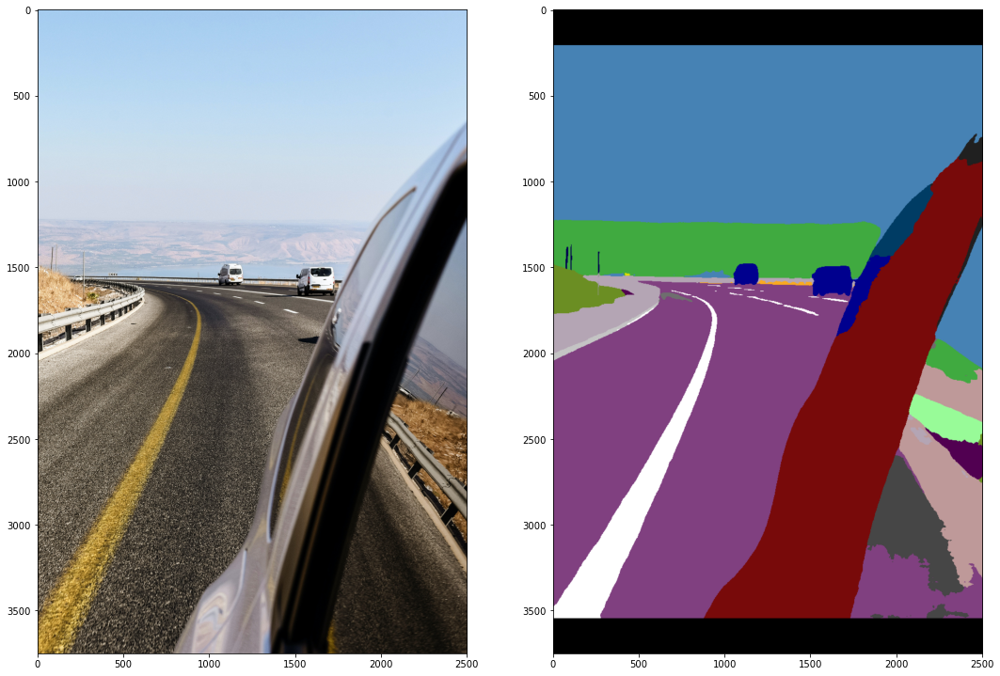

In [13]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams

%matplotlib inline

# figure size in inches optional
rcParams['figure.figsize'] = 18 ,13

# read images
input_file = mpimg.imread(file_name)
output_file = mpimg.imread(output_file_name)

# display images
fig, ax = plt.subplots(1,2)
ax[0].imshow(input_file);
ax[1].imshow(output_file);

#### E. Delete the endpoint

Note: To stop getting charged, you have to delete the endpoint.

In [14]:
predictor=sage.Predictor(model_name, sagemaker_session,content_type)
predictor.delete_endpoint(delete_endpoint_config=True)

### 5. Perform batch inference

This chapter explains how to:  
&nbsp;&nbsp;A. Create input payload using S3    
&nbsp;&nbsp;B. Perform batch inference  
&nbsp;&nbsp;C. Retrieve output and visualize output  

Clean up is not required.

If you are not familiar with batch transform, and want to learn more, see these links:
1. [How it works](https://docs.aws.amazon.com/sagemaker/latest/dg/ex1-batch-transform.html)
2. [How to run a batch transform job](https://docs.aws.amazon.com/sagemaker/latest/dg/how-it-works-batch.html)

Inference using GPU instances has much better batch inference speed performance.   
You are only charged for the duration of the batch job. However each job will have to initialize, which takes additional time.

#### A. Create input payload (S3)

In [15]:
#upload the batch-transform job input files to S3
transform_input_folder = "data/input/new"
transform_input = sagemaker_session.upload_data(transform_input_folder, key_prefix=model_name) 
print("Transform input uploaded to " + transform_input)


Transform input uploaded to s3://sagemaker-eu-central-1-875741056133/semantic-segmentation-152


#### B. Perform batch inference

In [21]:
# Support real time inference with ml.p3.2xlarge (preferred)
batch_transform_inference_instance_type='ml.p3.2xlarge'

transform_output_folder = "semantic_segmentation_152_classes/batch_transform_output"
output_path = "s3://{}/{}".format(sagemaker_session.default_bucket(), transform_output_folder)

#Run the batch-transform job
#Output logging will be shown below
transformer = model.transformer(instance_count=1, 
                                instance_type=batch_transform_inference_instance_type,
                                output_path=output_path,
                                accept=accept,
                                max_concurrent_transforms=2)


transformer.transform(transform_input, content_type=content_type)
transformer.wait()

............................................2021-05-14 14:37:29,438 [INFO ] W-1-__main__ - Starting the inference server with 1 workers.
2021-05-14 14:37:29,663 [INFO ] W-9-gunicorn.error - Starting gunicorn 20.1.0
2021-05-14 14:37:29,664 [INFO ] W-9-gunicorn.error - Listening at: unix:/tmp/gunicorn.sock (9)
2021-05-14 14:37:29,664 [INFO ] W-9-gunicorn.error - Using worker: uvicorn.workers.UvicornWorker
2021-05-14 14:37:29,666 [INFO ] W-20-gunicorn.error - Booting worker with pid: 20
2021-05-14 14:37:30,569 [INFO ] W-20-matplotlib.font_manager - Generating new fontManager, this may take some time...
2021-05-14 14:37:31,179 [INFO ] W-20-model.model_handler - init
2021-05-14 14:37:38,694 [INFO ] W-20-model.model_handler - => loaded checkpoint '/home/ml/modelmodel.pth.tar' (epoch 292)
2021-05-14 14:37:38,860 [INFO ] W-20-model.model_handler - load done
2021-05-14 14:37:38,868 [INFO ] W-20-uvicorn.error - Started server process [20]
2021-05-14 14:37:38,868 [INFO ] W-20-uvicorn.error - Wait

#### C. Retrieve and visualize output

In [22]:
#output is available on following path
transformer.output_path

's3://sagemaker-eu-central-1-875741056133/semantic_segmentation_152_classes/batch_transform_output'

In [23]:
import boto3

account_id = boto3.client("sts").get_caller_identity()["Account"]

In [24]:
%%bash  -s "$account_id"
aws s3 sync s3://sagemaker-eu-central-1-$1/semantic_segmentation_152_classes/batch_transform_output ./data/output/batch

download: s3://sagemaker-eu-central-1-875741056133/semantic_segmentation_152_classes/batch_transform_output/semantic-segmentation-152-video-frames/003.jpg.out to data/output/batch/semantic-segmentation-152-video-frames/003.jpg.out
download: s3://sagemaker-eu-central-1-875741056133/semantic_segmentation_152_classes/batch_transform_output/semantic-segmentation-152-video-frames/006.jpg.out to data/output/batch/semantic-segmentation-152-video-frames/006.jpg.out
download: s3://sagemaker-eu-central-1-875741056133/semantic_segmentation_152_classes/batch_transform_output/semantic-segmentation-152-video-frames/002.jpg.out to data/output/batch/semantic-segmentation-152-video-frames/002.jpg.out
download: s3://sagemaker-eu-central-1-875741056133/semantic_segmentation_152_classes/batch_transform_output/semantic-segmentation-152-video-frames/005.jpg.out to data/output/batch/semantic-segmentation-152-video-frames/005.jpg.out
download: s3://sagemaker-eu-central-1-875741056133/semantic_segmentation_152

In [25]:
import os
import glob

import cv2
import numpy as np

ORIG_FRAME_DIR = 'data/input/new/'
OUTPUT_DIR = 'data/output/batch/'
OVERLAY_DIR = 'data/output/batch-overlay/'


def apply_mask(img_path, mask_path, overlay_path):
    """
    Apply colored mask to image
    :param img_path:path to original image
    :param mask_path:path to generated segmentation image
    :param overlay_path:path to generated segmentation image
    """
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    mask = cv2.imread(mask_path, cv2.IMREAD_COLOR)

    lut = np.zeros((256, 1, 3), dtype=np.uint8)
    lut[:153, 0, 2] = [0, 165, 0, 250, 250, 250, 196, 190, 180, 90, 250, 250, 128, 250, 102, 128, 140, 170, 250, 250, 250, 96, 230, 128, 110, 110, 244, 128, 150, 70, 150, 150, 220, 220, 255, 255, 255, 255, 255, 250, 250, 250, 250, 250, 250, 250, 250, 250, 250, 250, 250, 255, 250, 250, 250, 250, 250, 250, 250, 250, 250, 255, 255, 250, 250, 250, 250, 250, 250, 250, 250, 250, 250, 128, 64, 230, 70, 190, 152, 107, 0, 255, 250, 100, 220, 222, 100, 40, 33, 100, 20, 142, 70, 111, 250, 250, 250, 250, 250, 250, 210, 153, 153, 128, 0, 210, 250, 250, 250, 250, 250, 250, 250, 250, 250, 250, 250, 250, 250, 250, 250, 250, 250, 250, 192, 192, 192, 220, 220, 0, 192, 220, 140, 119, 150, 0, 0, 0, 0, 0, 128, 0, 0, 0, 0, 170, 110, 32, 111, 120, 81, 111, 0, ]
    lut[:153, 0, 1] = [0, 42, 192, 170, 170, 170, 196, 153, 165, 120, 170, 170, 128, 170, 102, 64, 140, 170, 170, 170, 170, 96, 150, 64, 110, 110, 35, 196, 100, 70, 150, 120, 20, 20, 0, 0, 0, 255, 255, 170, 170, 170, 170, 170, 170, 170, 170, 170, 170, 170, 170, 255, 170, 170, 170, 170, 170, 170, 170, 170, 170, 255, 255, 170, 170, 170, 170, 170, 170, 170, 170, 170, 170, 32, 170, 160, 130, 255, 251, 142, 170, 255, 0, 140, 128, 40, 170, 40, 33, 128, 20, 0, 100, 74, 171, 172, 173, 174, 175, 176, 170, 153, 153, 128, 0, 60, 170, 180, 170, 160, 170, 170, 170, 204, 187, 201, 170, 170, 170, 170, 213, 170, 218, 223, 192, 192, 192, 220, 220, 0, 192, 220, 140, 11, 0, 60, 0, 0, 0, 80, 64, 0, 0, 0, 0, 170, 110, 32, 74, 10, 0, 111, 0, ]
    lut[:153, 0, 0] = [0, 42, 0, 30, 31, 32, 196, 153, 180, 150, 33, 34, 128, 35, 156, 255, 200, 170, 36, 160, 37, 96, 140, 128, 110, 110, 232, 128, 100, 70, 150, 90, 60, 60, 0, 100, 200, 255, 255, 29, 28, 27, 26, 25, 24, 23, 22, 18, 21, 20, 19, 255, 19, 18, 17, 16, 15, 14, 13, 12, 11, 255, 255, 14, 13, 12, 10, 9, 6, 5, 4, 3, 2, 32, 64, 50, 180, 255, 152, 35, 30, 128, 30, 180, 128, 40, 30, 40, 33, 160, 255, 0, 150, 0, 30, 30, 30, 30, 30, 30, 100, 153, 153, 128, 80, 60, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 192, 192, 192, 0, 0, 196, 192, 0, 20, 32, 255, 100, 142, 90, 230, 100, 64, 110, 70, 142, 192, 170, 110, 32, 0, 10, 81, 0, 0, ]

    height, width, _ = img.shape
    mask = cv2.resize(mask, (width, height))

    seg_color = cv2.LUT(mask, lut)
    overlay = cv2.addWeighted(img, 0.3, seg_color, 0.6, 0)

    overlay = cv2.resize(overlay, (1920, int(height/width*1920)))
    cv2.imwrite(overlay_path, overlay)

for mask_name in glob.glob(OUTPUT_DIR + '*.jpg.out'):
    # read images
    ref = os.path.basename(mask_name)
    print(mask_name)
    file_name = ORIG_FRAME_DIR+ref.split(".")[0]+'.jpg'
    overlay_file_name = OVERLAY_DIR+ref.split(".")[0]+'.png'
    apply_mask(file_name, mask_name, overlay_file_name)
    

data/output/batch/pexels-mario-cuadros-2958635.jpg.out
data/output/batch/pexels-johannes-rapprich-769647.jpg.out
data/output/batch/pexels-lina-kivaka-2253913.jpg.out
data/output/batch/pexels-edwin-josé-vega-ramos-2039626.jpg.out
data/output/batch/pexels-cottonbro-4550418.jpg.out
data/output/batch/image01.jpg.out
data/output/batch/pexels-sid-ali-2794005.jpg.out
data/output/batch/pexels-alexandr-podvalny-1031698.jpg.out
data/output/batch/pexels-jiarong-deng-1034663.jpg.out
data/output/batch/pexels-dimitriss-1441932.jpg.out
data/output/batch/pexels-megan-markham-2449533.jpg.out
data/output/batch/pexels-guilherme-rossi-1705073.jpg.out
data/output/batch/pexels-ksenia-chernaya-3951671.jpg.out


In [26]:
!pip install ipyplot
import ipyplot
import glob
ipyplot.plot_images(glob.glob('data/output/batch-overlay/*.png'), max_images=20, img_width=150)

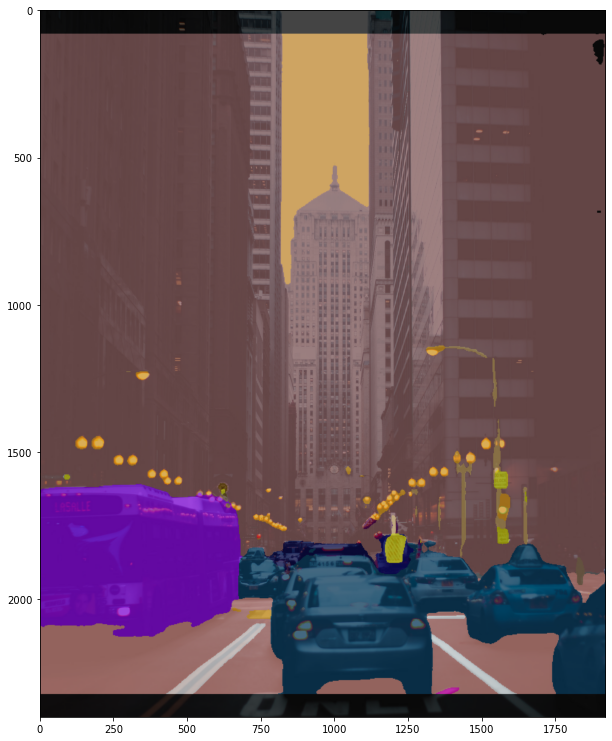

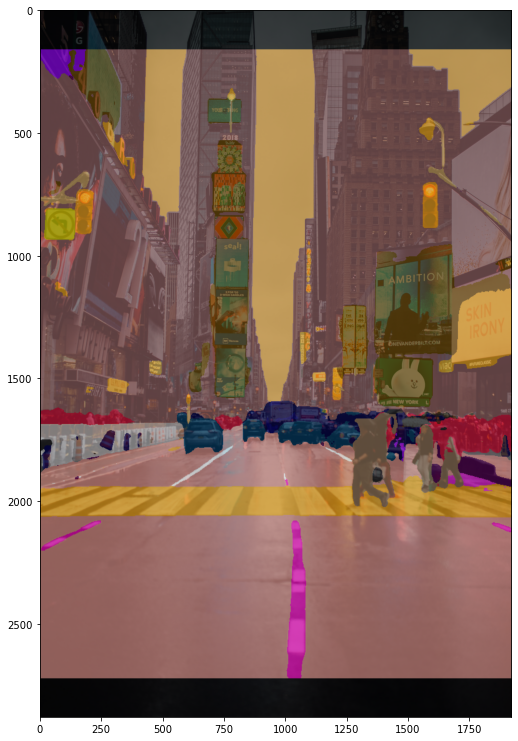

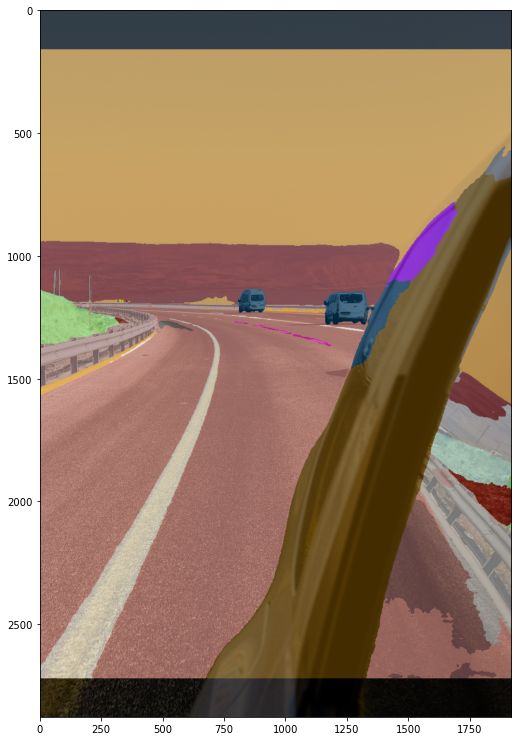

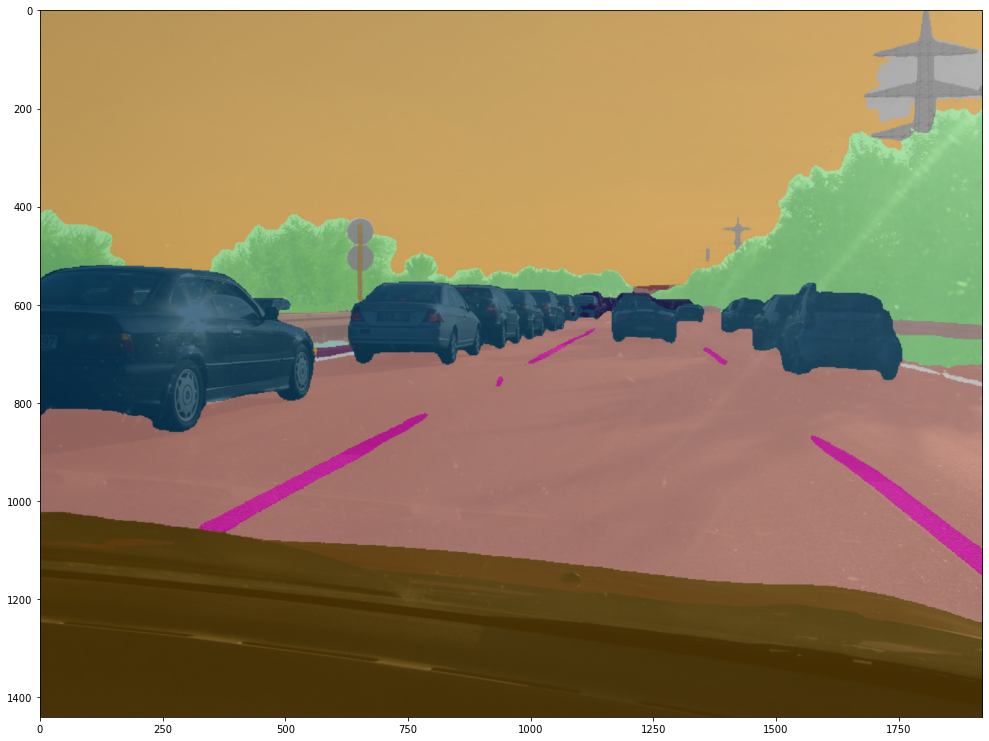

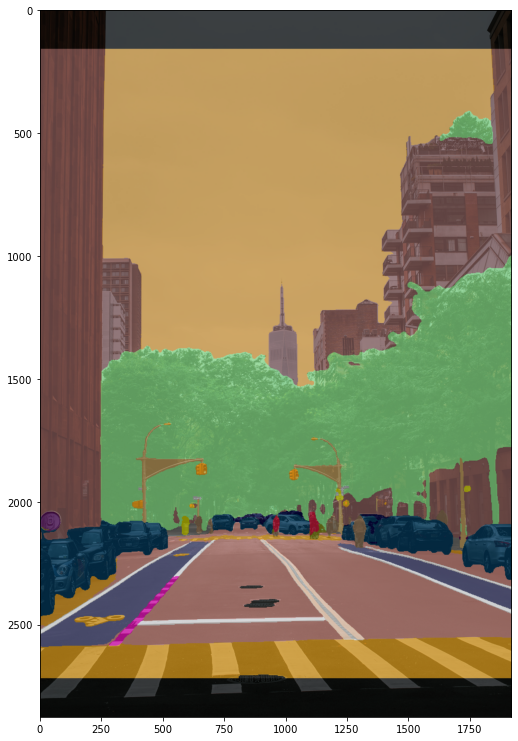

...

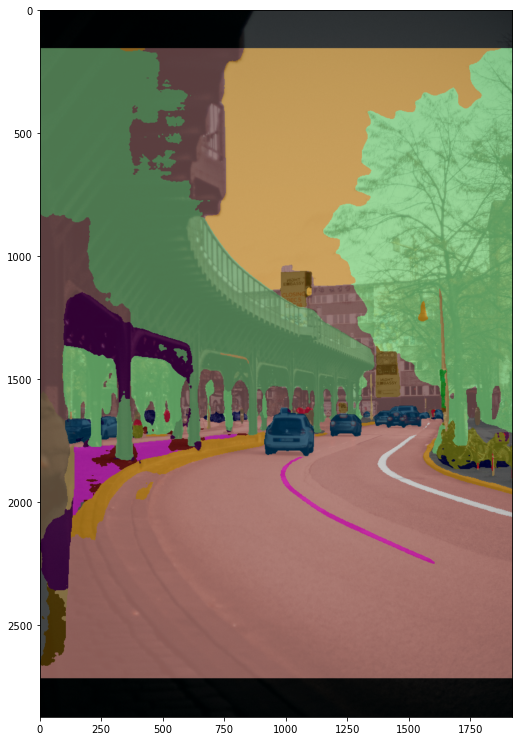

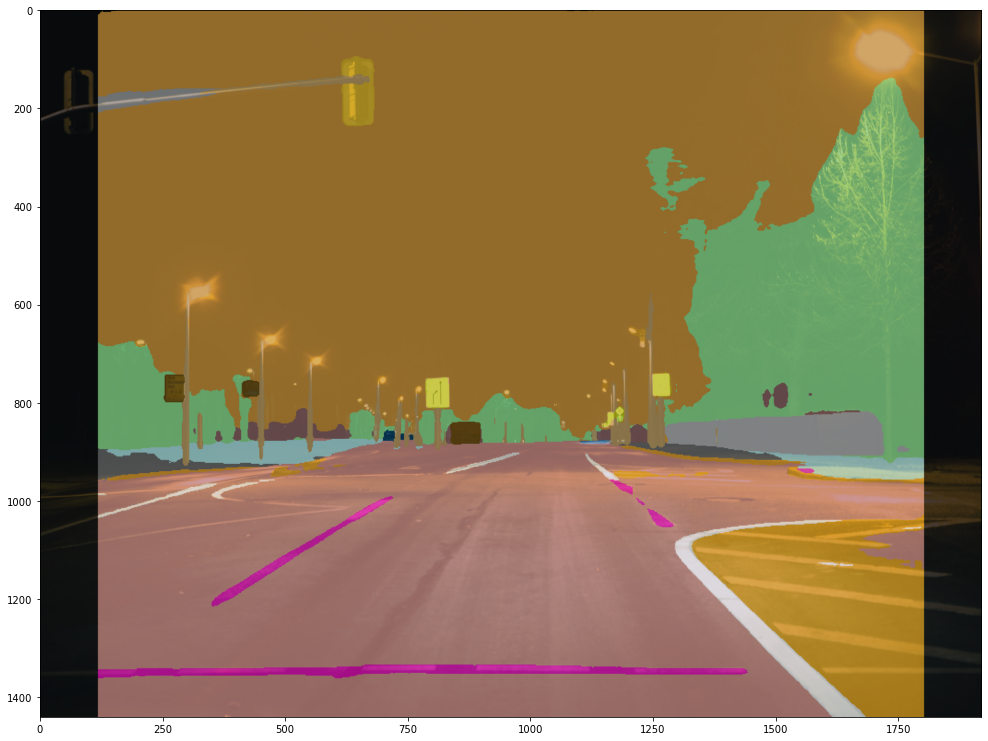

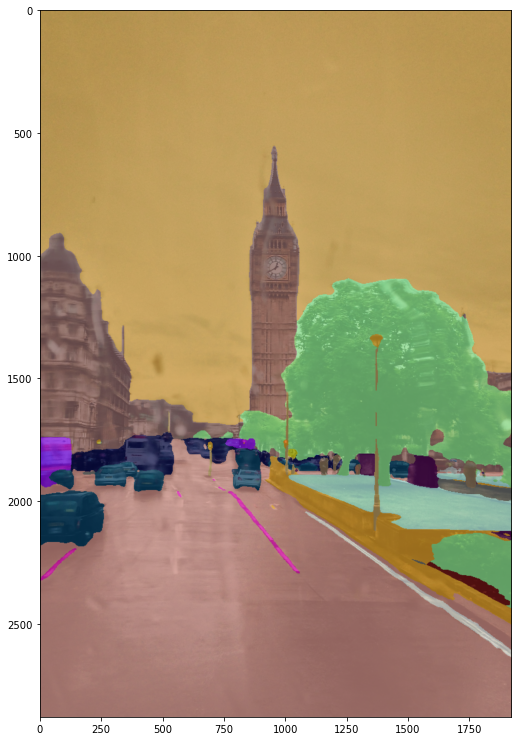

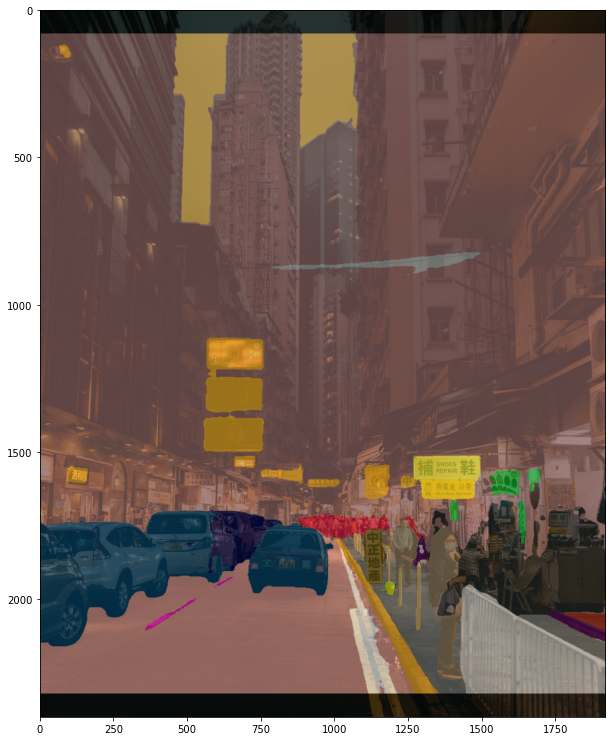

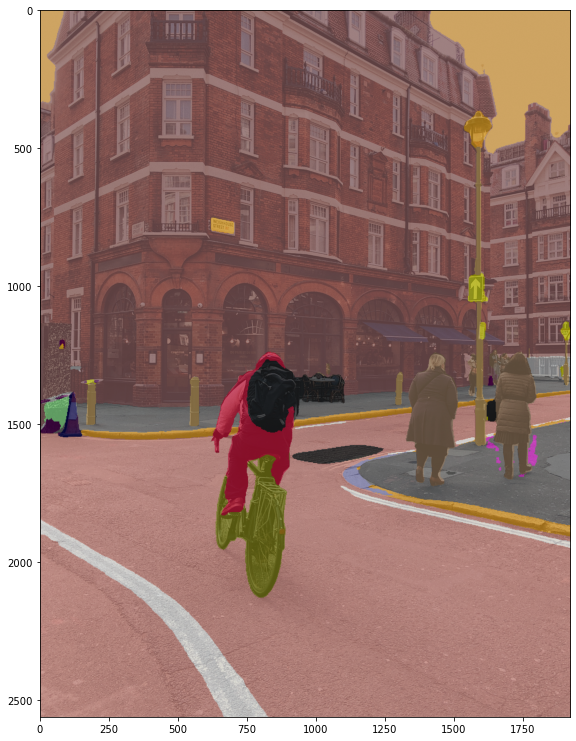

In [27]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
for imageName in glob.glob('data/output/batch-overlay/*.png'):
    img = mpimg.imread(imageName)
    plt.figure()
    plt.imshow(img)

#### D. Realtime processing of video

In [23]:
conda install -c conda-forge ffmpeg

Solving environment: - 
The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - conda-forge/noarch::requests==2.25.1=pyhd3deb0d_0
  - conda-forge/linux-64::jupyter_server==1.4.1=py36h5fab9bb_0
  - conda-forge/linux-64::thinc==8.0.1=py36h355b2fd_1
  - conda-forge/noarch::black==20.8b1=py_1
  - conda-forge/noarch::google-cloud-core==1.5.0=pyhd3deb0d_0
  - defaults/linux-64::_anaconda_depends==5.1.0=py36_2
  - conda-forge/noarch::pyls-black==0.4.6=pyh9f0ad1d_0
  - conda-forge/noarch::pyls-spyder==0.3.2=pyhd8ed1ab_0
  - conda-forge/linux-64::anyio==2.1.0=py36h5fab9bb_0
  - conda-forge/noarch::smart_open==2.2.1=pyh9f0ad1d_0
  - conda-forge/noarch::jupyterlab_server==2.3.0=pyhd8ed1ab_0
  - conda-forge/linux-64::spyder==4.2.0=py36h5fab9bb_0
  - conda-forge/noarch::python-language-server==0.36.2=pyhd8ed1ab_0
  - conda-forge/noarch::sphinx==3.5.1=pyhd8ed1ab_0
  - conda-forge/noarch::nbclassic==0.2.6=pyhd8ed1ab_0
  - con

In [28]:
!ffmpeg -i "data/input/video/Pexels-Videos-1296835.mp4" -vf fps=29 "data/input/video-frames/$filename%03d.jpg"

ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 9.3.0 (crosstool-NG 1.24.0.133_b0863d8_dirty)
  configuration: --prefix=/home/ec2-user/anaconda3/envs/pytorch_p36 --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1609680890771/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --pkg-config=/home/conda/feedstock_root/build_artifacts/ffmpeg_1609680890771/_build_env/bin/pkg-config
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3. 

In [29]:
# Support real time inference with ml.p2.xlarge (preferred)
batch_transform_inference_instance_type='ml.p3.2xlarge'

transform_input_folder = 'data/input/video-frames/'
s3_folder_name = model_name+"-video-frames"
transform_input = sagemaker_session.upload_data(transform_input_folder, key_prefix=s3_folder_name) 
print("Transform input uploaded to " + transform_input)


transform_output_folder = "generic_semantic_segmentation/video_transform_output"
output_path = "s3://{}/{}".format(sagemaker_session.default_bucket(), transform_output_folder)

#Run the batch-transform job
#Output logging will be shown below
accept = "image/png"
transformer = model.transformer(instance_count=1, 
                                instance_type=batch_transform_inference_instance_type,
                                output_path=output_path,
                                accept=accept,
                                max_concurrent_transforms=4)


transformer.transform(transform_input, content_type=content_type)
transformer.wait()

Transform input uploaded to s3://sagemaker-eu-central-1-875741056133/semantic-segmentation-152-video-frames
......................................2021-05-12 15:54:40,530 [INFO ] W-1-__main__ - Starting the inference server with 1 workers.
2021-05-12 15:54:40,782 [INFO ] W-9-gunicorn.error - Starting gunicorn 20.1.0
2021-05-12 15:54:40,784 [INFO ] W-9-gunicorn.error - Listening at: unix:/tmp/gunicorn.sock (9)
2021-05-12 15:54:40,784 [INFO ] W-9-gunicorn.error - Using worker: uvicorn.workers.UvicornWorker
2021-05-12 15:54:40,786 [INFO ] W-20-gunicorn.error - Booting worker with pid: 20
2021-05-12 15:54:41,792 [INFO ] W-20-matplotlib.font_manager - Generating new fontManager, this may take some time...
2021-05-12 15:54:42,522 [INFO ] W-20-model.model_handler - init
2021-05-12 15:54:50,491 [INFO ] W-20-model.model_handler - => loaded checkpoint '/home/ml/modelmodel.pth.tar' (epoch 292)
2021-05-12 15:54:50,669 [INFO ] W-20-model.model_handler - load done
2021-05-12 15:54:50,678 [INFO ] W-20

In [30]:
segmented_video_folder = transformer.output_path

In [31]:
%%bash  -s "$segmented_video_folder"
aws s3 sync $1 ./data/output/video-frames

download: s3://sagemaker-eu-central-1-875741056133/generic_semantic_segmentation/video_transform_output/002.jpg.out to data/output/video-frames/002.jpg.out
download: s3://sagemaker-eu-central-1-875741056133/generic_semantic_segmentation/video_transform_output/003.jpg.out to data/output/video-frames/003.jpg.out
download: s3://sagemaker-eu-central-1-875741056133/generic_semantic_segmentation/video_transform_output/004.jpg.out to data/output/video-frames/004.jpg.out
download: s3://sagemaker-eu-central-1-875741056133/generic_semantic_segmentation/video_transform_output/006.jpg.out to data/output/video-frames/006.jpg.out
download: s3://sagemaker-eu-central-1-875741056133/generic_semantic_segmentation/video_transform_output/001.jpg.out to data/output/video-frames/001.jpg.out
download: s3://sagemaker-eu-central-1-875741056133/generic_semantic_segmentation/video_transform_output/011.jpg.out to data/output/video-frames/011.jpg.out
download: s3://sagemaker-eu-central-1-875741056133/generic_seman

In [32]:
ORIG_VID_FRAME_DIR = 'data/input/video-frames/'
OUTPUT_VID_FRAME_DIR = 'data/output/video-frames/'
OVERLAY_VID_FRAME_DIR = 'data/output/video-frames-overlay/'


for mask_name in glob.glob(OUTPUT_VID_FRAME_DIR + '*.jpg.out'):
    # read images
    ref = os.path.basename(mask_name)
    file_name = ORIG_VID_FRAME_DIR+ref.split(".")[0]+'.jpg'
    overlay_file_name = OVERLAY_VID_FRAME_DIR+ref.split(".")[0]+'.png'
    apply_mask(file_name, mask_name, overlay_file_name)

In [33]:
!ffmpeg -r 29 -i "data/output/video-frames-overlay/%03d.png" -c:v libx264 -vf "fps=25,format=yuv420p" "data/output/video-frames-overlay/Pexels-Videos-1296835.mp4"

ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 9.3.0 (crosstool-NG 1.24.0.133_b0863d8_dirty)
  configuration: --prefix=/home/ec2-user/anaconda3/envs/pytorch_p36 --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1609680890771/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --pkg-config=/home/conda/feedstock_root/build_artifacts/ffmpeg_1609680890771/_build_env/bin/pkg-config
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3. 

In [20]:
from IPython.display import Video

Video("data/output/video-frames-overlay/Pexels-Videos-1296835.mp4", embed=True)

### 6. Clean-up

#### A. Delete the model

In [35]:
model.delete_model()

#### B. Unsubscribe (optional)

To unsubscribe to the model package, follow these steps:   
Before you cancel the subscription, ensure that you do not have a [running model](https://console.aws.amazon.com/sagemaker/home#/models) or are using the algorithm.   
Note - You can find this information by looking at the container name associated with the model. 

**Steps to unsubscribe this product from AWS Marketplace**:
1. Navigate to __Machine Learning__ tab on [__Your Software subscriptions page__](https://aws.amazon.com/marketplace/ai/library?productType=ml&ref_=mlmp_gitdemo_indust)
2. Locate the listing that you want to cancel the subscription for, then choose __Cancel Subscription__  to cancel the subscription.


Sample dataset contains images from [Pexels](https://www.pexels.com/)

### 7. List of classes

| Class number | Class name | Readable name | Instances | Eval | Color |
| --- | --- | --- | --- | --- | --- |
| 0 | animal--bird | Bird | TRUE | TRUE | RGB(165,42,42) |
| 1 | animal--ground-animal | Ground Animal | TRUE | TRUE | RGB(0,192,0) |
| 2 | construction--barrier--acoustic | Acoustic Barrier | FALSE | TRUE | RGB(250,170,30) |
| 3 | construction--barrier--ambiguous | Ambiguous Barrier | FALSE | FALSE | RGB(250,170,31) |
| 4 | construction--barrier--concrete-block | Concrete Block | FALSE | TRUE | RGB(250,170,32) |
| 5 | construction--barrier--curb | Curb | FALSE | TRUE | RGB(196,196,196) |
| 6 | construction--barrier--fence | Fence | FALSE | TRUE | RGB(190,153,153) |
| 7 | construction--barrier--guard-rail | Guard Rail | FALSE | TRUE | RGB(180,165,180) |
| 8 | construction--barrier--other-barrier | Barrier | FALSE | TRUE | RGB(90,120,150) |
| 9 | construction--barrier--road-median | Road Median | FALSE | TRUE | RGB(250,170,33) |
| 10 | construction--barrier--road-side | Road Side | FALSE | TRUE | RGB(250,170,34) |
| 11 | construction--barrier--separator | Lane Separator | FALSE | TRUE | RGB(128,128,128) |
| 12 | construction--barrier--temporary | Temporary Barrier | TRUE | TRUE | RGB(250,170,35) |
| 13 | construction--barrier--wall | Wall | FALSE | TRUE | RGB(102,102,156) |
| 14 | construction--flat--bike-lane | Bike Lane | FALSE | TRUE | RGB(128,64,255) |
| 15 | construction--flat--crosswalk-plain | Crosswalk - Plain | TRUE | TRUE | RGB(140,140,200) |
| 16 | construction--flat--curb-cut | Curb Cut | FALSE | TRUE | RGB(170,170,170) |
| 17 | construction--flat--driveway | Driveway | TRUE | TRUE | RGB(250,170,36) |
| 18 | construction--flat--parking | Parking | FALSE | TRUE | RGB(250,170,160) |
| 19 | construction--flat--parking-aisle | Parking Aisle | FALSE | TRUE | RGB(250,170,37) |
| 20 | construction--flat--pedestrian-area | Pedestrian Area | FALSE | TRUE | RGB(96,96,96) |
| 21 | construction--flat--rail-track | Rail Track | FALSE | TRUE | RGB(230,150,140) |
| 22 | construction--flat--road | Road | FALSE | TRUE | RGB(128,64,128) |
| 23 | construction--flat--road-shoulder | Road Shoulder | FALSE | TRUE | RGB(110,110,110) |
| 24 | construction--flat--service-lane | Service Lane | FALSE | TRUE | RGB(110,110,110) |
| 25 | construction--flat--sidewalk | Sidewalk | FALSE | TRUE | RGB(244,35,232) |
| 26 | construction--flat--traffic-island | Traffic Island | FALSE | TRUE | RGB(128,196,128) |
| 27 | construction--structure--bridge | Bridge | FALSE | TRUE | RGB(150,100,100) |
| 28 | construction--structure--building | Building | FALSE | TRUE | RGB(70,70,70) |
| 29 | construction--structure--garage | Garage | FALSE | TRUE | RGB(150,150,150) |
| 30 | construction--structure--tunnel | Tunnel | FALSE | TRUE | RGB(150,120,90) |
| 31 | human--person--individual | Person | TRUE | TRUE | RGB(220,20,60) |
| 32 | human--person--person-group | Person Group | FALSE | FALSE | RGB(220,20,60) |
| 33 | human--rider--bicyclist | Bicyclist | TRUE | TRUE | RGB(255,0,0) |
| 34 | human--rider--motorcyclist | Motorcyclist | TRUE | TRUE | RGB(255,0,100) |
| 35 | human--rider--other-rider | Other Rider | TRUE | TRUE | RGB(255,0,200) |
| 36 | marking--continuous--dashed | Lane Marking - Dashed Line | FALSE | TRUE | RGB(255,255,255) |
| 37 | marking--continuous--solid | Lane Marking - Straight Line | FALSE | TRUE | RGB(255,255,255) |
| 38 | marking--continuous--zigzag | Lane Marking - Zigzag Line | FALSE | TRUE | RGB(250,170,29) |
| 39 | marking--discrete--ambiguous | Lane Marking - Ambiguous | FALSE | FALSE | RGB(250,170,28) |
| 40 | marking--discrete--arrow--ambiguous | Lane Marking - Arrow (Ambiguous) | TRUE | FALSE | RGB(250,170,27) |
| 41 | marking--discrete--arrow--left | Lane Marking - Arrow (Left) | TRUE | TRUE | RGB(250,170,26) |
| 42 | marking--discrete--arrow--other | Lane Marking - Arrow (Other) | TRUE | TRUE | RGB(250,170,25) |
| 43 | marking--discrete--arrow--right | Lane Marking - Arrow (Right) | TRUE | TRUE | RGB(250,170,24) |
| 44 | marking--discrete--arrow--split-left-or-right | Lane Marking - Arrow (Split Left or Right) | TRUE | TRUE | RGB(250,170,23) |
| 45 | marking--discrete--arrow--split-left-or-straight | Lane Marking - Arrow (Split Left or Straight) | TRUE | TRUE | RGB(250,170,22) |
| 46 | marking--discrete--arrow--split-left-right-or-straight | Lane Marking - Arrow (Split L/R or Straight) | TRUE | TRUE | RGB(250,170,18) |
| 47 | marking--discrete--arrow--split-right-or-straight | Lane Marking - Arrow (Split Right or Straight) | TRUE | TRUE | RGB(250,170,21) |
| 48 | marking--discrete--arrow--straight | Lane Marking - Arrow (Straight) | TRUE | TRUE | RGB(250,170,20) |
| 49 | marking--discrete--arrow--u-turn | Lane Marking - Arrow (U-Turn) | TRUE | TRUE | RGB(250,170,19) |
| 50 | marking--discrete--crosswalk-zebra | Lane Marking - Crosswalk | TRUE | TRUE | RGB(255,255,255) |
| 51 | marking--discrete--give-way-row | Lane Marking - Give Way (Row) | TRUE | TRUE | RGB(250,170,19) |
| 52 | marking--discrete--give-way-single | Lane Marking - Give Way (Single) | TRUE | TRUE | RGB(250,170,18) |
| 53 | marking--discrete--graphics--ambiguous | Lane Marking - Graphics (Ambiguous) | TRUE | FALSE | RGB(250,170,17) |
| 54 | marking--discrete--graphics--bicycle | Lane Marking - Graphics (Bicycle) | TRUE | TRUE | RGB(250,170,16) |
| 55 | marking--discrete--graphics--other | Lane Marking - Graphics (Other) | TRUE | TRUE | RGB(250,170,15) |
| 56 | marking--discrete--graphics--pedestrian | Lane Marking - Graphics (Pedestrian) | TRUE | TRUE | RGB(250,170,14) |
| 57 | marking--discrete--graphics--wheelchair | Lane Marking - Graphics (Wheelchair) | TRUE | TRUE | RGB(250,170,13) |
| 58 | marking--discrete--hatched--chevron | Lane Marking - Hatched (Chevron) | FALSE | TRUE | RGB(250,170,12) |
| 59 | marking--discrete--hatched--diagonal | Lane Marking - Hatched (Diagonal) | FALSE | TRUE | RGB(250,170,11) |
| 60 | marking--discrete--other-marking | Lane Marking - Other | TRUE | TRUE | RGB(255,255,255) |
| 61 | marking--discrete--stop-line | Lane Marking - Stop Line | TRUE | TRUE | RGB(255,255,255) |
| 62 | marking--discrete--text--30 | Lane Marking - Text (30) | TRUE | TRUE | RGB(250,170,14) |
| 63 | marking--discrete--text--40 | Lane Marking - Text (40) | TRUE | TRUE | RGB(250,170,13) |
| 64 | marking--discrete--text--50 | Lane Marking - Text (50) | TRUE | TRUE | RGB(250,170,12) |
| 65 | marking--discrete--text--ambiguous | Lane Marking - Text (Ambiguous) | TRUE | FALSE | RGB(250,170,10) |
| 66 | marking--discrete--text--bus | Lane Marking - Text (Bus) | TRUE | TRUE | RGB(250,170,9) |
| 67 | marking--discrete--text--other | Lane Marking - Text (Other) | TRUE | TRUE | RGB(250,170,6) |
| 68 | marking--discrete--text--school | Lane Marking - Text (School) | TRUE | TRUE | RGB(250,170,5) |
| 69 | marking--discrete--text--slow | Lane Marking - Text (Slow) | TRUE | TRUE | RGB(250,170,4) |
| 70 | marking--discrete--text--stop | Lane Marking - Text (Stop) | TRUE | TRUE | RGB(250,170,3) |
| 71 | marking--discrete--text--taxi | Lane Marking - Text (Taxi) | TRUE | TRUE | RGB(250,170,2) |
| 72 | nature--beach | Beach | FALSE | TRUE | RGB(128,32,32) |
| 73 | nature--mountain | Mountain | FALSE | TRUE | RGB(64,170,64) |
| 74 | nature--sand | Sand | FALSE | TRUE | RGB(230,160,50) |
| 75 | nature--sky | Sky | FALSE | TRUE | RGB(70,130,180) |
| 76 | nature--snow | Snow | FALSE | TRUE | RGB(190,255,255) |
| 77 | nature--terrain | Terrain | FALSE | TRUE | RGB(152,251,152) |
| 78 | nature--vegetation | Vegetation | FALSE | TRUE | RGB(107,142,35) |
| 79 | nature--water | Water | FALSE | TRUE | RGB(0,170,30) |
| 80 | object--banner | Banner | TRUE | TRUE | RGB(255,255,128) |
| 81 | object--bench | Bench | TRUE | TRUE | RGB(250,0,30) |
| 82 | object--bike-rack | Bike Rack | TRUE | TRUE | RGB(100,140,180) |
| 83 | object--catch-basin | Catch Basin | TRUE | TRUE | RGB(220,128,128) |
| 84 | object--cctv-camera | CCTV Camera | TRUE | TRUE | RGB(222,40,40) |
| 85 | object--fire-hydrant | Fire Hydrant | TRUE | TRUE | RGB(100,170,30) |
| 86 | object--junction-box | Junction Box | TRUE | TRUE | RGB(40,40,40) |
| 87 | object--mailbox | Mailbox | TRUE | TRUE | RGB(33,33,33) |
| 88 | object--manhole | Manhole | TRUE | TRUE | RGB(100,128,160) |
| 89 | object--parking-meter | Parking Meter | TRUE | TRUE | RGB(20,20,255) |
| 90 | object--phone-booth | Phone Booth | TRUE | TRUE | RGB(142,0,0) |
| 91 | object--pothole | Pothole | FALSE | TRUE | RGB(70,100,150) |
| 92 | object--ramp | Ramp | FALSE | TRUE | RGB(111,74,0) |
| 93 | object--sign--advertisement | Signage - Advertisement | TRUE | TRUE | RGB(250,171,30) |
| 94 | object--sign--ambiguous | Signage - Ambiguous | TRUE | FALSE | RGB(250,172,30) |
| 95 | object--sign--back | Signage - Back | TRUE | TRUE | RGB(250,173,30) |
| 96 | object--sign--information | Signage - Information | TRUE | TRUE | RGB(250,174,30) |
| 97 | object--sign--other | Signage - Other | TRUE | TRUE | RGB(250,175,30) |
| 98 | object--sign--store | Signage - Store | TRUE | TRUE | RGB(250,176,30) |
| 99 | object--street-light | Street Light | TRUE | TRUE | RGB(210,170,100) |
| 100 | object--support--pole | Pole | TRUE | TRUE | RGB(153,153,153) |
| 101 | object--support--pole-group | Pole Group | FALSE | FALSE | RGB(153,153,153) |
| 102 | object--support--traffic-sign-frame | Traffic Sign Frame | TRUE | TRUE | RGB(128,128,128) |
| 103 | object--support--utility-pole | Utility Pole | TRUE | TRUE | RGB(0,0,80) |
| 104 | object--traffic-cone | Traffic Cone | TRUE | TRUE | RGB(210,60,60) |
| 105 | object--traffic-light--ambiguous | Traffic Light - Ambiguous | TRUE | FALSE | RGB(250,170,30) |
| 106 | object--traffic-light--cyclists-back | Traffic Light - Cyclists (Back) | TRUE | TRUE | RGB(250,180,30) |
| 107 | object--traffic-light--cyclists-front | Traffic Light - Cyclists (Front) | TRUE | TRUE | RGB(250,170,30) |
| 108 | object--traffic-light--cyclists-side | Traffic Light - Cyclists (Side) | TRUE | TRUE | RGB(250,160,30) |
| 109 | object--traffic-light--general-horizontal-back | Traffic Light - General (Horizontal/Back) | TRUE | TRUE | RGB(250,170,30) |
| 110 | object--traffic-light--general-horizontal-front | Traffic Light - General (Horizontal/Front) | TRUE | TRUE | RGB(250,170,30) |
| 111 | object--traffic-light--general-horizontal-side | Traffic Light - General (Horizontal/Side) | TRUE | TRUE | RGB(250,170,30) |
| 112 | object--traffic-light--general-single-back | Traffic Light - General (Single/Back) | TRUE | TRUE | RGB(250,204,30) |
| 113 | object--traffic-light--general-single-front | Traffic Light - General (Single/Front) | TRUE | TRUE | RGB(250,187,30) |
| 114 | object--traffic-light--general-single-side | Traffic Light - General (Single/Side) | TRUE | TRUE | RGB(250,201,30) |
| 115 | object--traffic-light--general-upright-back | Traffic Light - General (Upright/Back) | TRUE | TRUE | RGB(250,170,30) |
| 116 | object--traffic-light--general-upright-front | Traffic Light - General (Upright/Front) | TRUE | TRUE | RGB(250,170,30) |
| 117 | object--traffic-light--general-upright-side | Traffic Light - General (Upright/Side) | TRUE | TRUE | RGB(250,170,30) |
| 118 | object--traffic-light--other | Traffic Light - Other | TRUE | TRUE | RGB(250,170,30) |
| 119 | object--traffic-light--pedestrians-back | Traffic Light - Pedestrians (Back) | TRUE | TRUE | RGB(250,213,30) |
| 120 | object--traffic-light--pedestrians-front | Traffic Light - Pedestrians (Front) | TRUE | TRUE | RGB(250,170,30) |
| 121 | object--traffic-light--pedestrians-side | Traffic Light - Pedestrians (Side) | TRUE | TRUE | RGB(250,218,30) |
| 122 | object--traffic-light--warning | Traffic Light - Warning | TRUE | TRUE | RGB(250,223,30) |
| 123 | object--traffic-sign--ambiguous | Traffic Sign - Ambiguous | TRUE | FALSE | RGB(192,192,192) |
| 124 | object--traffic-sign--back | Traffic Sign (Back) | TRUE | TRUE | RGB(192,192,192) |
| 125 | object--traffic-sign--direction-back | Traffic Sign - Direction (Back) | TRUE | TRUE | RGB(192,192,192) |
| 126 | object--traffic-sign--direction-front | Traffic Sign - Direction (Front) | TRUE | TRUE | RGB(220,220,0) |
| 127 | object--traffic-sign--front | Traffic Sign (Front) | TRUE | TRUE | RGB(220,220,0) |
| 128 | object--traffic-sign--information-parking | Traffic Sign - Parking | TRUE | TRUE | RGB(0,0,196) |
| 129 | object--traffic-sign--temporary-back | Traffic Sign - Temporary (Back) | TRUE | TRUE | RGB(192,192,192) |
| 130 | object--traffic-sign--temporary-front | Traffic Sign - Temporary (Front) | TRUE | TRUE | RGB(220,220,0) |
| 131 | object--trash-can | Trash Can | TRUE | TRUE | RGB(140,140,20) |
| 132 | object--vehicle--bicycle | Bicycle | TRUE | TRUE | RGB(119,11,32) |
| 133 | object--vehicle--boat | Boat | TRUE | TRUE | RGB(150,0,255) |
| 134 | object--vehicle--bus | Bus | TRUE | TRUE | RGB(0,60,100) |
| 135 | object--vehicle--car | Car | TRUE | TRUE | RGB(0,0,142) |
| 136 | object--vehicle--caravan | Caravan | TRUE | TRUE | RGB(0,0,90) |
| 137 | object--vehicle--motorcycle | Motorcycle | TRUE | TRUE | RGB(0,0,230) |
| 138 | object--vehicle--on-rails | On Rails | TRUE | TRUE | RGB(0,80,100) |
| 139 | object--vehicle--other-vehicle | Other Vehicle | TRUE | TRUE | RGB(128,64,64) |
| 140 | object--vehicle--trailer | Trailer | TRUE | TRUE | RGB(0,0,110) |
| 141 | object--vehicle--truck | Truck | TRUE | TRUE | RGB(0,0,70) |
| 142 | object--vehicle--vehicle-group | Vehicle Group | FALSE | FALSE | RGB(0,0,142) |
| 143 | object--vehicle--wheeled-slow | Wheeled Slow | TRUE | TRUE | RGB(0,0,192) |
| 144 | object--water-valve | Water Valve | TRUE | TRUE | RGB(170,170,170) |
| 145 | object--wire-group | Wire Group | FALSE | TRUE | RGB(110,110,110) |
| 146 | void--car-mount | Car Mount | FALSE | TRUE | RGB(32,32,32) |
| 147 | void--dynamic | Dynamic | FALSE | TRUE | RGB(111,74,0) |
| 148 | void--ego-vehicle | Ego Vehicle | FALSE | TRUE | RGB(120,10,10) |
| 149 | void--ground | Ground | FALSE | TRUE | RGB(81,0,81) |
| 150 | void--static | Static | FALSE | TRUE | RGB(111,111,0) |
| 151 | void--unlabeled | Unlabeled | FALSE | FALSE | RGB(0,0,0) |